In [30]:
# Imports
import os
import numpy as np
import pandas as pd

import seaborn as sb
import plotly.express as px
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn.metrics import euclidean_distances
from scipy.spatial.distance import cdist

import warnings
warnings.filterwarnings("ignore")

In [31]:
# Find the latest version of spark 3.x  from http://www.apache.org/dist/spark/ and enter as the spark version
# spark_version = 'spark-3.4.1'
spark_version = 'spark-3.4.1'
os.environ['SPARK_VERSION']=spark_version

# Install Spark and Java
!apt-get update
!apt-get install openjdk-11-jdk-headless -qq > /dev/null
!wget -q http://www.apache.org/dist/spark/$SPARK_VERSION/$SPARK_VERSION-bin-hadoop3.tgz
!tar xf $SPARK_VERSION-bin-hadoop3.tgz
!pip install -q findspark

# Set Environment Variables
os.environ["JAVA_HOME"] = "/usr/lib/jvm/java-11-openjdk-amd64"
os.environ["SPARK_HOME"] = f"/content/{spark_version}-bin-hadoop3"

# Start a SparkSession
import findspark
findspark.init()

Hit:1 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease
Hit:2 http://archive.ubuntu.com/ubuntu jammy InRelease
Hit:3 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Hit:4 http://archive.ubuntu.com/ubuntu jammy-updates InRelease
Hit:5 http://security.ubuntu.com/ubuntu jammy-security InRelease
Hit:6 http://archive.ubuntu.com/ubuntu jammy-backports InRelease
Hit:7 https://ppa.launchpadcontent.net/c2d4u.team/c2d4u4.0+/ubuntu jammy InRelease
Hit:8 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:9 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Hit:10 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Reading package lists... Done


In [32]:
# Import packages
from pyspark.sql import SparkSession
from pyspark.sql import Row
from pyspark.sql.types import StructType,StructField,StringType, DateType,IntegerType
from pyspark.sql.functions import col

# Create a SparkSession
spark = SparkSession.builder.appName("SparkSQL").getOrCreate()

In [33]:
# Read in data from your directory
from pyspark import SparkFiles
url = "https://raw.githubusercontent.com/sarsteg/music-recommendations-machine-learning/main/Data/cleaned_data.csv"
spark.sparkContext.addFile(url)
data = spark.read.csv(SparkFiles.get("cleaned_data.csv"), header=True, inferSchema=True)

# Show DataFrame
data.show()

+------------------+----+------------+--------------------+------------------+-----------+------+--------+----------------+---+--------+-------------------+----+--------------------+----------+-----------+-----------------+
|           valence|year|acousticness|             artists|      danceability|duration_ms|energy|explicit|instrumentalness|key|liveness|           loudness|mode|                name|popularity|speechiness|            tempo|
+------------------+----+------------+--------------------+------------------+-----------+------+--------+----------------+---+--------+-------------------+----+--------------------+----------+-----------+-----------------+
|            0.0594|1921|       0.982|Sergei Rachmanino...|             0.279|     831667| 0.211|       0|           0.878| 10|   0.665|            -20.096|   1|Piano Concerto No...|         4|     0.0366|           80.954|
|             0.963|1921|       0.732|          Dennis Day|0.8190000000000001|     180533| 0.341|       

In [34]:
# Define a dictionary with column names and their target data types
conversion_dict = {
    "danceability": "float",
    "duration_ms": "int",
    "energy": "float",
    "explicit": "int",
    "instrumentalness": "float",
    "key": "int",
    "liveness": "float",
    "loudness": "float",
    "mode": "int",
    "popularity": "int",
    "speechiness": "float",
    "tempo": "float"
}

# Iterate through the dictionary and apply the conversions
for col_name, target_type in conversion_dict.items():
    data = data.withColumn(col_name, col(col_name).cast(target_type))

In [35]:
data = data.dropna()

In [36]:
# Read in data from your directory
url = "https://raw.githubusercontent.com/sarsteg/music-recommendations-machine-learning/main/Data/data_by_genres.csv"
spark.sparkContext.addFile(url)
genres = spark.read.csv(SparkFiles.get("data_by_genres.csv"), header=True, inferSchema=True)

# Show DataFrame
genres.show()

+----+--------------------+-------------------+-------------------+------------------+-------------------+--------------------+-------------------+-------------------+--------------------+------------------+-------------------+------------------+---+
|mode|              genres|       acousticness|       danceability|       duration_ms|             energy|    instrumentalness|           liveness|           loudness|         speechiness|             tempo|            valence|        popularity|key|
+----+--------------------+-------------------+-------------------+------------------+-------------------+--------------------+-------------------+-------------------+--------------------+------------------+-------------------+------------------+---+
|   1|21st century clas...| 0.9793333333333332|0.16288333333333335|160297.66666666663|0.07131666666666665|          0.60683367|             0.3616|-31.514333333333337| 0.04056666666666667|           75.3365|0.10378333333333334| 27.83333333333333| 

In [37]:
# Create our temporary views
data.createOrReplaceTempView('songs')
genres.createOrReplaceTempView('genres')

In [38]:
# Create data_df table in spark
data_df = spark.sql("""
    SELECT
    name,
    artists,
    valence,
    year,
    acousticness,
    danceability,
    duration_ms,
    energy,
    explicit,
    instrumentalness,
    key,
    liveness,
    loudness,
    mode,
    popularity,
    speechiness,
    tempo
    FROM songs
    """)

# Make sure we got what we wanted
data_df.show()

+--------------------+--------------------+------------------+----+------------+------------+-----------+------+--------+----------------+---+--------+--------+----+----------+-----------+-------+
|                name|             artists|           valence|year|acousticness|danceability|duration_ms|energy|explicit|instrumentalness|key|liveness|loudness|mode|popularity|speechiness|  tempo|
+--------------------+--------------------+------------------+----+------------+------------+-----------+------+--------+----------------+---+--------+--------+----+----------+-----------+-------+
|Piano Concerto No...|Sergei Rachmanino...|            0.0594|1921|       0.982|       0.279|     831667| 0.211|       0|           0.878| 10|   0.665| -20.096|   1|         4|     0.0366| 80.954|
|Clancy Lowered th...|          Dennis Day|             0.963|1921|       0.732|       0.819|     180533| 0.341|       0|             0.0|  7|    0.16| -12.441|   1|         5|      0.415| 60.936|
|           Gat

In [39]:
# Convert data_df to a pandas dataframe
data_pd = data_df.orderBy("year").select(
    "name",
    "artists",
    "valence",
    "year",
    "acousticness",
    "danceability",
    "duration_ms",
    "energy",
    "explicit",
    "instrumentalness",
    "key",
    "liveness",
    "loudness",
    "mode",
    "popularity",
    "speechiness",
    "tempo"
).toPandas()

# Display dataframe
display(data_pd.head())

,name,artists,valence,year,acousticness,danceability,duration_ms,energy,explicit,instrumentalness,key,liveness,loudness,mode,popularity,speechiness,tempo
0,"Piano Concerto No. 3 in D Minor, Op. 30: III. ...","Sergei Rachmaninoff', 'James Levine', 'Berline...",0.0594,1921,0.982,0.279,831667,0.211,0,0.878000,10,0.665,-20.096001,1,4,0.0366,80.954002
1,Clancy Lowered the Boom,Dennis Day,0.9630,1921,0.732,0.819,180533,0.341,0,0.000000,7,0.160,-12.441000,1,5,0.4150,60.936001
2,Gati Bali,KHP Kridhamardawa Karaton Ngayogyakarta Hadini...,0.0394,1921,0.961,0.328,500062,0.166,0,0.913000,3,0.101,-14.850000,1,5,0.0339,110.338997
3,Danny Boy,Frank Parker,0.1650,1921,0.967,0.275,210000,0.309,0,0.000028,5,0.381,-9.316000,1,3,0.0354,100.109001
4,When Irish Eyes Are Smiling,Phil Regan,0.2530,1921,0.957,0.418,166693,0.193,0,0.000002,3,0.229,-10.096000,1,2,0.0380,101.665001


In [69]:
# Save as CSV
data_pd.to_csv('data_pd.csv', index=False)

In [40]:
# Create genres_df table in spark
genres_df = spark.sql("""
    SELECT
    genres,
    mode,
    acousticness,
    danceability,
    duration_ms,
    energy,
    instrumentalness,
    liveness,
    loudness,
    speechiness,
    tempo,
    valence,
    popularity,
    key
    FROM genres
    """)

# Make sure we got what we wanted
genres_df.show()

+--------------------+----+-------------------+-------------------+------------------+-------------------+--------------------+-------------------+-------------------+--------------------+------------------+-------------------+------------------+---+
|              genres|mode|       acousticness|       danceability|       duration_ms|             energy|    instrumentalness|           liveness|           loudness|         speechiness|             tempo|            valence|        popularity|key|
+--------------------+----+-------------------+-------------------+------------------+-------------------+--------------------+-------------------+-------------------+--------------------+------------------+-------------------+------------------+---+
|21st century clas...|   1| 0.9793333333333332|0.16288333333333335|160297.66666666663|0.07131666666666665|          0.60683367|             0.3616|-31.514333333333337| 0.04056666666666667|           75.3365|0.10378333333333334| 27.83333333333333| 

In [41]:
# Convert genres_df to a pandas dataframe
genres_pd = genres_df.orderBy("genres").select(
    "genres",
    "mode",
    "acousticness",
    "danceability",
    "duration_ms",
    "energy",
    "instrumentalness",
    "liveness",
    "loudness",
    "speechiness",
    "tempo",
    "valence",
    "popularity",
    "key"
).toPandas()

# Display dataframe
display(genres_pd.head())

,genres,mode,acousticness,danceability,duration_ms,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,popularity,key
0,21st century classical,1,0.979333,0.162883,1.602977e+05,0.071317,0.606834,0.361600,-31.514333,0.040567,75.336500,0.103783,27.833333,6
1,432hz,1,0.494780,0.299333,1.048887e+06,0.450678,0.477762,0.131000,-16.854000,0.076817,120.285667,0.221750,52.500000,5
2,8-bit,1,0.762000,0.712000,1.151770e+05,0.818000,0.876000,0.126000,-9.180000,0.047000,133.444000,0.975000,48.000000,7
3,[],1,0.651417,0.529093,2.328809e+05,0.419146,0.205309,0.218696,-12.288965,0.107872,112.857352,0.513604,20.859882,7
4,a cappella,1,0.676557,0.538961,1.906285e+05,0.316434,0.003003,0.172254,-12.479387,0.082851,112.110362,0.448249,45.820071,7


In [42]:
# Create dataframes with only numerical values for X
data_pd_X = data_pd.select_dtypes(np.number)
genres_pd_X = genres_pd.select_dtypes(np.number)

In [43]:
# Create a a list to store inertia values and the values of k
inertia = []
k = list(range(1, 21))

In [44]:
# Create a for-loop where each value of k is evaluated using the K-means algorithm
# Fit the model using the service_ratings DataFrame
# Append the value of the computed inertia from the `inertia_` attribute of the KMeans model instance
for i in k:
    k_model = KMeans(n_clusters=i, random_state=1)
    k_model.fit(data_pd_X)
    inertia.append(k_model.inertia_)

In [45]:
# Define a DataFrame to hold the values for k and the corresponding inertia
elbow_data = {"k": k, "inertia": inertia}
data_df_elbow = pd.DataFrame(elbow_data)

# Review the DataFrame
data_df_elbow.head()

,k,inertia
0,1,2.259756e+15
1,2,1.282092e+15
2,3,7.697184e+14
3,4,4.887288e+14
4,5,3.386195e+14


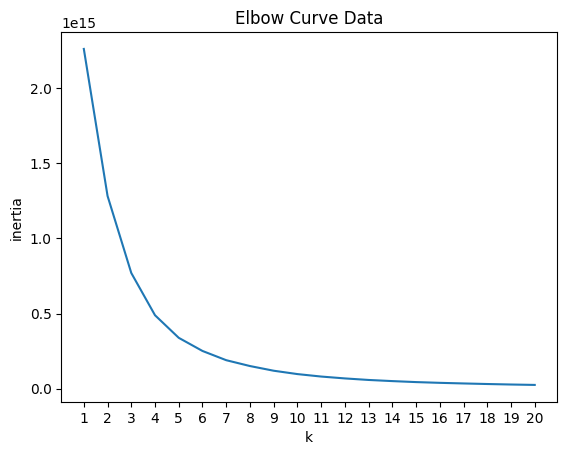

In [46]:
# Assuming data_df_elbow is your DataFrame plot the Elbow Curve
sb.lineplot(x="k", y="inertia", data=data_df_elbow)
plt.title("Elbow Curve Data")
plt.xticks(k)
plt.show()

In [47]:
# Create a a list to store inertia values and the values of k
inertia = []
k = list(range(1, 11))

In [48]:
# Create a for-loop where each value of k is evaluated using the K-means algorithm
# Fit the model using the service_ratings DataFrame
# Append the value of the computed inertia from the `inertia_` attribute of the KMeans model instance
for i in k:
    k_model = KMeans(n_clusters=i, random_state=1)
    k_model.fit(genres_pd_X)
    inertia.append(k_model.inertia_)

In [49]:
# Define a DataFrame to hold the values for k and the corresponding inertia
elbow_data = {"k": k, "inertia": inertia}
genres_df_elbow = pd.DataFrame(elbow_data)

# Review the DataFrame
genres_df_elbow.head()

,k,inertia
0,1,2.662889e+13
1,2,1.613410e+13
2,3,7.650518e+12
3,4,4.896291e+12
4,5,3.385496e+12


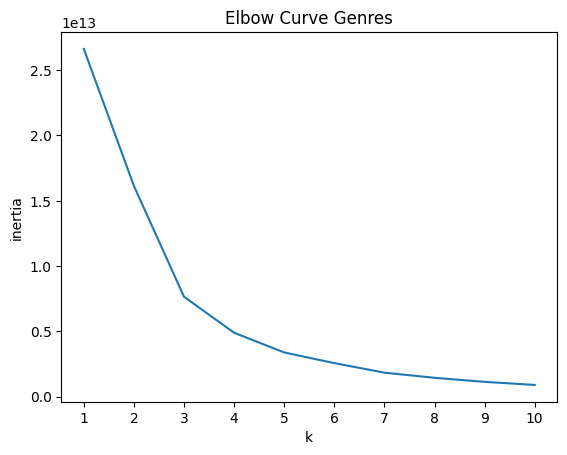

In [50]:
# Assuming genres_df_elbow is your DataFrame plot the Elbow Curve
sb.lineplot(x="k", y="inertia", data=genres_df_elbow)
plt.title("Elbow Curve Genres")
plt.xticks(k)
plt.show()

In [51]:
# Create clusters for genres_pd using Pipeline
cluster_pipeline = Pipeline([('scaler', StandardScaler()), ('kmeans', KMeans(n_clusters=7))])
cluster_pipeline.fit(genres_pd_X)
genres_pd['cluster'] = cluster_pipeline.predict(genres_pd_X)

In [52]:
# Visualizing the Clusters with t-SNE
tsne_pipeline = Pipeline([('scaler', StandardScaler()), ('tsne', TSNE(n_components=2, verbose=1))])
genre_embedding = tsne_pipeline.fit_transform(genres_pd_X)
projection = pd.DataFrame(columns=['x', 'y'], data=genre_embedding)
projection['genres'] = genres_pd['genres']
projection['cluster'] = genres_pd['cluster']

# Plot the scatter t-SNE graph
fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'genres'])
fig.show()

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 2973 samples in 0.005s...
[t-SNE] Computed neighbors for 2973 samples in 0.323s...
[t-SNE] Computed conditional probabilities for sample 1000 / 2973
[t-SNE] Computed conditional probabilities for sample 2000 / 2973
[t-SNE] Computed conditional probabilities for sample 2973 / 2973
[t-SNE] Mean sigma: 0.777516
[t-SNE] KL divergence after 250 iterations with early exaggeration: 76.106232
[t-SNE] KL divergence after 1000 iterations: 1.393958


In [53]:
# Create clusters for data_pd using Pipeline
data_cluster_pipeline = Pipeline([('scaler', StandardScaler()),
                                  ('kmeans', KMeans(n_clusters=20,
                                   verbose=False))
                                 ], verbose=False)

number_cols = list(data_pd_X.columns)
data_cluster_pipeline.fit(data_pd_X)
data_cluster_labels = data_cluster_pipeline.predict(data_pd_X)
data_pd['cluster_label'] = data_cluster_labels

In [66]:
# Import joblib
import joblib

# Save the pipeline
joblib.dump(data_cluster_pipeline, 'data_cluster_pipeline.pkl')

['data_cluster_pipeline.pkl']

In [54]:
# Visualizing the Clusters with PCA
pca_pipeline = Pipeline([('scaler', StandardScaler()), ('PCA', PCA(n_components=2))])
data_embedding = pca_pipeline.fit_transform(data_pd_X)
projection = pd.DataFrame(columns=['x', 'y'], data=data_embedding)
projection['title'] = data_pd['name']
projection['cluster'] = data_pd['cluster_label']

# Plot the scatter PCA graph
fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'title'])
fig.show()